In [168]:
import pandas as pd
import logging
from pytrends.request import TrendReq
from sklearn.metrics import mean_absolute_error
from sktime.forecasting.model_selection import temporal_train_test_split

logging.getLogger('prophet').setLevel(logging.ERROR)
logging.getLogger('cmdstanpy').setLevel(logging.ERROR)
logging.getLogger('prophet').setLevel(logging.CRITICAL)

In [169]:
gold = pd.read_excel('Gold_historical_data.xlsx')
gold['Date'] = pd.to_datetime(gold['Date'])  
gold.set_index('Date', inplace=True)  
gold

,Price
Date,
2023-05-05 16:00:00,2016.37
2023-05-05 15:00:00,2018.10
2023-05-05 14:00:00,2016.68
2023-05-05 13:00:00,2015.57
2023-05-05 12:00:00,2017.23
...,...
2019-01-01 21:00:00,1282.75
2019-01-01 20:00:00,1279.89
2019-01-01 19:00:00,1280.17


In [170]:
silver = pd.read_excel('Silver_historical_data.xlsx')
silver['Date'] = pd.to_datetime(silver['Date'])  
silver.set_index('Date', inplace=True)  
silver

,Price
Date,
2023-05-05 16:00:00,25.6623
2023-05-05 15:00:00,25.6595
2023-05-05 14:00:00,25.6443
2023-05-05 13:00:00,25.6001
2023-05-05 12:00:00,25.6355
...,...
2019-01-01 13:00:00,15.5100
2019-01-01 12:00:00,15.5100
2019-01-01 07:00:00,15.5100


In [171]:
import pandas as pd
from datetime import datetime, timedelta
import numpy as np


def coin_price_hist(coin_id, vs_currency, days, interval):
    import pandas as pd
    import json
    from pycoingecko import CoinGeckoAPI
    cg = CoinGeckoAPI()

    df = cg.get_coin_market_chart_by_id(id=coin_id, vs_currency=vs_currency, days=days, interval=interval)
    x = json.dumps(df)
    y = pd.read_json(x)
    z = pd.DataFrame()
    z['market_tms'] = pd.to_datetime(pd.to_numeric(y.prices.str[0]), unit='ms')
    z['price'] = y.prices.str[1]
    z['mkt_cap'] = y.market_caps.str[1]
    z['total_volumes'] = y.market_caps.str[1]
    z = z.sort_values(by=['market_tms'], ascending=False)
    return (z)


def coin_candle_hist(coin_id, vs_currency, days):
    import pandas as pd
    import json
    from pycoingecko import CoinGeckoAPI
    cg = CoinGeckoAPI()
    df = cg.get_coin_ohlc_by_id(id=coin_id, vs_currency=vs_currency, days=days)
    x = json.dumps(df)
    y = pd.read_json(x)
    z = pd.DataFrame()
    z['market_tms'] = pd.to_datetime(y[0], unit='ms')
    z['open'] = y[1]
    z['high'] = y[2]
    z['low'] = y[3]
    z['close'] = y[4]
    z = z.sort_values(by=['market_tms'], ascending=False)
    return (z)


def get_binance_exchange_info():
    import pandas as pd
    from pycoingecko import CoinGeckoAPI
    cg = CoinGeckoAPI()

    binance_exchange = pd.DataFrame(columns=['base', 'target', 'market', 'last',
                                             'volume', 'converted_last', 'converted_volume',
                                             'trust_score', 'bid_ask_spread_percentage', 'timestamp',
                                             'last_traded_at', 'last_fetch_at', 'is_anomaly', 'is_stale',
                                             'trade_url', 'token_info_url', 'coin_id', 'target_coin_id'])

    for i in range(1, 11):
        df = cg.get_exchanges_tickers_by_id(id='binance', page=i, depth=True)
        page = pd.DataFrame(df['tickers'],
                            columns=['base', 'target', 'market', 'last',
                                     'volume', 'converted_last', 'converted_volume',
                                     'trust_score', 'bid_ask_spread_percentage', 'timestamp',
                                     'last_traded_at', 'last_fetch_at', 'is_anomaly', 'is_stale',
                                     'trade_url', 'token_info_url', 'coin_id', 'target_coin_id'])
        frames = [binance_exchange, page]

        binance_exchange = pd.concat(frames)
    return(binance_exchange)


def import_coin_list():
    import pandas as pd
    from pycoingecko import CoinGeckoAPI
    cg = CoinGeckoAPI()
    df = cg.get_coins_markets('usd')
    coin_list = pd.DataFrame(df, columns=['id', 'symbol', 'name'])
    coin_list['symbol'] = coin_list['symbol'].apply(lambda x: x.upper())
    return coin_list

def get_coin_hist_tms(coin):
	hist = pd.read_csv("data/" + coin +  "_btc.csv")
	hist = hist.iloc[::-1]
	return hist

def g_trend_pull(keywords):
	from pytrends.request import TrendReq
	pytrend = TrendReq()
	pytrend.build_payload(kw_list=keywords, timeframe='today 3-m')
	df = pytrend.interest_over_time()
	return df

### Indices for CoinGecko Price Search

In [172]:
index = import_coin_list()
index.head(10)

,id,symbol,name
0,bitcoin,BTC,Bitcoin
1,ethereum,ETH,Ethereum
2,tether,USDT,Tether
3,binancecoin,BNB,BNB
4,usd-coin,USDC,USD Coin
5,ripple,XRP,XRP
6,cardano,ADA,Cardano
7,staked-ether,STETH,Lido Staked Ether
8,dogecoin,DOGE,Dogecoin
9,matic-network,MATIC,Polygon


In [173]:
#btc = coin_price_hist('bitcoin', 'usd', 85, 'hourly')
#btc.set_index('market_tms').price.plot(title="BTC / USD (Last 85 Days")

In [174]:
btc_searches = g_trend_pull(['bitcoin'])
btc_searches

,bitcoin,isPartial
date,,
2023-02-26,53,False
2023-02-27,55,False
2023-02-28,54,False
2023-03-01,53,False
2023-03-02,52,False
...,...,...
2023-05-18,56,False
2023-05-19,51,False
2023-05-20,47,False


In [175]:
btc_searches['market_tms'] = btc_searches.index + pd.DateOffset(days=3)
btc_searches = btc_searches.set_index('market_tms')
btc_searches = btc_searches['bitcoin'].resample('H').ffill()
#btc_searches = btc_searches.astype(float)
btc_searches

market_tms
2023-03-01 00:00:00    53
2023-03-01 01:00:00    53
2023-03-01 02:00:00    53
2023-03-01 03:00:00    53
2023-03-01 04:00:00    53
                       ..
2023-05-24 20:00:00    48
2023-05-24 21:00:00    48
2023-05-24 22:00:00    48
2023-05-24 23:00:00    48
2023-05-25 00:00:00    53
Freq: H, Name: bitcoin, Length: 2041, dtype: int64

In [176]:
btc_searches = pd.DataFrame(btc_searches)
btc_searches = btc_searches.reset_index()
btc_searches.rename(columns={'market_tms': 'Date','bitcoin':'btc_searches'}, inplace=True)
btc_searches

,Date,btc_searches
0,2023-03-01 00:00:00,53
1,2023-03-01 01:00:00,53
2,2023-03-01 02:00:00,53
3,2023-03-01 03:00:00,53
4,2023-03-01 04:00:00,53
...,...,...
2036,2023-05-24 20:00:00,48
2037,2023-05-24 21:00:00,48
2038,2023-05-24 22:00:00,48
2039,2023-05-24 23:00:00,48


In [177]:
import plotly.offline as py
import plotly.graph_objs as go
import copy
import matplotlib.pyplot as plt
from prophet.plot import plot_plotly
import pandas as pd
# import util_prophet
from prophet import Prophet

In [178]:
btc

,Date,btc_price
0,2023-05-25 16:00:00,26240.927025
1,2023-05-25 15:00:00,26372.015091
2,2023-05-25 14:00:00,26327.107512
3,2023-05-25 13:00:00,26377.526969
4,2023-05-25 12:00:00,26247.910008
...,...,...
2020,2023-03-02 13:00:00,23349.073025
2021,2023-03-02 12:00:00,23423.026553
2022,2023-03-02 11:00:00,23412.569663
2023,2023-03-02 10:00:00,23429.430046


In [179]:
btc = pd.read_excel('BTC_Date.xlsx')
btc1= btc[['Date','btc_price']].copy()
btc1.rename(columns={'market_tms': 'Date'}, inplace=True)
btc1

,Date,btc_price
0,2023-05-25 16:00:00,26240.927025
1,2023-05-25 15:00:00,26372.015091
2,2023-05-25 14:00:00,26327.107512
3,2023-05-25 13:00:00,26377.526969
4,2023-05-25 12:00:00,26247.910008
...,...,...
2020,2023-03-02 13:00:00,23349.073025
2021,2023-03-02 12:00:00,23423.026553
2022,2023-03-02 11:00:00,23412.569663
2023,2023-03-02 10:00:00,23429.430046


In [180]:
gold = gold.reset_index()
gold

,Date,Price
0,2023-05-05 16:00:00,2016.37
1,2023-05-05 15:00:00,2018.10
2,2023-05-05 14:00:00,2016.68
3,2023-05-05 13:00:00,2015.57
4,2023-05-05 12:00:00,2017.23
...,...,...
26778,2019-01-01 21:00:00,1282.75
26779,2019-01-01 20:00:00,1279.89
26780,2019-01-01 19:00:00,1280.17
26781,2019-01-01 18:00:00,1281.29


In [181]:
silver = silver.reset_index()
silver

,Date,Price
0,2023-05-05 16:00:00,25.6623
1,2023-05-05 15:00:00,25.6595
2,2023-05-05 14:00:00,25.6443
3,2023-05-05 13:00:00,25.6001
4,2023-05-05 12:00:00,25.6355
...,...,...
26809,2019-01-01 13:00:00,15.5100
26810,2019-01-01 12:00:00,15.5100
26811,2019-01-01 07:00:00,15.5100
26812,2019-01-01 03:00:00,15.5105


In [182]:
btc1.rename(columns={'price': 'btc_price'}, inplace=True)
gold.rename(columns={'Price': 'gold_price'}, inplace=True)
silver.rename(columns={'Price': 'silver_price'}, inplace=True)
btc1 = btc1[17:]
gold1 = gold[:len(btc1)].copy()
silver1 = silver[:len(btc1)].copy()

In [183]:
len(btc1)

2008

In [184]:
gold1.tail()

,Date,gold_price
2003,2023-01-06 03:00:00,1837.08
2004,2023-01-06 02:00:00,1838.42
2005,2023-01-06 01:00:00,1839.00
2006,2023-01-06 00:00:00,1837.23
2007,2023-01-05 23:00:00,1838.14


In [185]:
gold1.head()

,Date,gold_price
0,2023-05-05 16:00:00,2016.37
1,2023-05-05 15:00:00,2018.10
2,2023-05-05 14:00:00,2016.68
3,2023-05-05 13:00:00,2015.57
4,2023-05-05 12:00:00,2017.23


In [186]:
btc1.head()

,Date,btc_price
17,2023-05-24 23:00:00,26340.456307
18,2023-05-24 22:00:00,26365.125463
19,2023-05-24 21:00:00,26404.486519
20,2023-05-24 20:00:00,26276.319771
21,2023-05-24 19:00:00,26264.501781


In [187]:
btc1.tail()

,Date,btc_price
2020,2023-03-02 13:00:00,23349.073025
2021,2023-03-02 12:00:00,23423.026553
2022,2023-03-02 11:00:00,23412.569663
2023,2023-03-02 10:00:00,23429.430046
2024,2023-03-02 09:00:00,23449.933923


In [188]:
merged_df.index

RangeIndex(start=0, stop=1055, step=1)

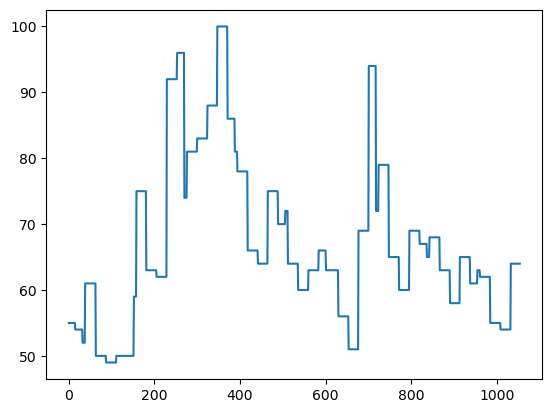

In [189]:
plt.plot(merged_df['btc_searches'])

In [190]:
# Convert the 'Date' column to datetime format if it's not already
gold = gold1.copy()
silver = silver1.copy()
btc_searches1 = btc_searches.copy()

btc1['Date'] = pd.to_datetime(btc1['Date'])
gold['Date'] = pd.to_datetime(gold['Date'])
silver['Date'] = pd.to_datetime(silver['Date'])
btc_searches1['Date'] = pd.to_datetime(btc_searches1['Date'])

# Round 'Date' to the nearest hour
btc1['Date'] = btc1['Date'].dt.round('H')
gold['Date'] = gold['Date'].dt.round('H')
silver['Date'] = silver['Date'].dt.round('H')

# Merge DataFrames
merged_df = pd.merge(btc1, gold, on='Date', how='inner')
merged_df = pd.merge(merged_df, silver, on='Date', how='inner')
merged_df = pd.merge(merged_df, btc_searches1, on='Date', how='inner')


# Sort the merged DataFrame by date
merged_df.sort_values(by='Date', inplace=True, ascending=True)
merged_df.reset_index(drop=True, inplace=True)

merged_df = merged_df.sort_values(by='Date')
merged_df

/var/folders/5_/40ns8l_j0mg5t389fsnkby7h0000gn/T/ipykernel_33917/1151095879.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/5_/40ns8l_j0mg5t389fsnkby7h0000gn/T/ipykernel_33917/1151095879.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,btc_price,gold_price,silver_price,btc_searches
0,2023-03-02 09:00:00,23449.933923,1836.68,20.8265,55
1,2023-03-02 10:00:00,23429.430046,1836.80,20.8629,55
2,2023-03-02 11:00:00,23412.569663,1836.15,20.8173,55
3,2023-03-02 12:00:00,23423.026553,1833.90,20.7980,55
4,2023-03-02 13:00:00,23349.073025,1836.07,20.8755,55
...,...,...,...,...,...
1069,2023-05-05 12:00:00,29126.246355,2017.23,25.6355,61
1070,2023-05-05 13:00:00,29061.097134,2015.57,25.6001,61
1071,2023-05-05 14:00:00,29113.834095,2016.68,25.6443,61
1072,2023-05-05 15:00:00,29314.966380,2018.10,25.6595,61


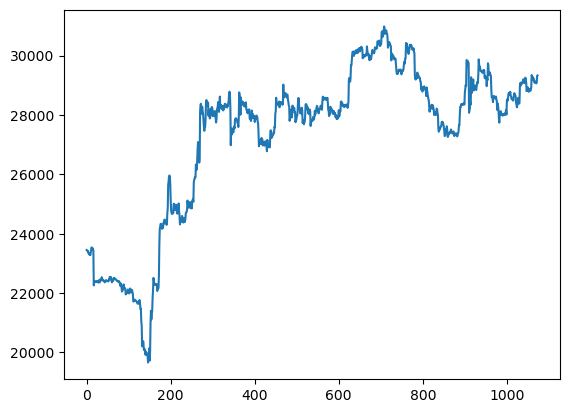

In [191]:
plt.plot(merged_df['btc_price'])

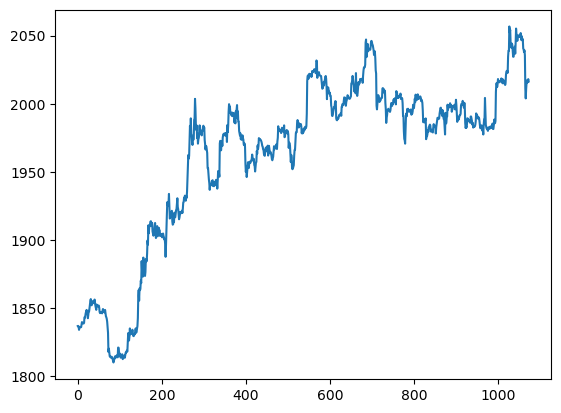

In [192]:
plt.plot(merged_df['gold_price'])

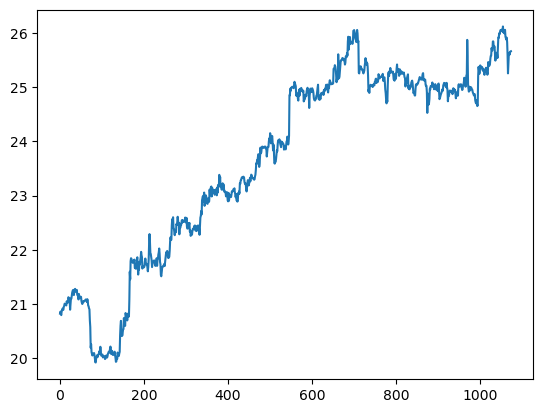

In [193]:
plt.plot(merged_df['silver_price'])

In [194]:
merged_df.rename(columns={'btc_price': 'y'}, inplace=True)
#merged_df.rename(columns={'Date': 'ds'}, inplace=True)

In [195]:
66 * 16

1056

In [196]:
len(merged_df)

1074

In [197]:
merged_df 

,Date,y,gold_price,silver_price,btc_searches
0,2023-03-02 09:00:00,23449.933923,1836.68,20.8265,55
1,2023-03-02 10:00:00,23429.430046,1836.80,20.8629,55
2,2023-03-02 11:00:00,23412.569663,1836.15,20.8173,55
3,2023-03-02 12:00:00,23423.026553,1833.90,20.7980,55
4,2023-03-02 13:00:00,23349.073025,1836.07,20.8755,55
...,...,...,...,...,...
1069,2023-05-05 12:00:00,29126.246355,2017.23,25.6355,61
1070,2023-05-05 13:00:00,29061.097134,2015.57,25.6001,61
1071,2023-05-05 14:00:00,29113.834095,2016.68,25.6443,61
1072,2023-05-05 15:00:00,29314.966380,2018.10,25.6595,61


In [198]:
len(merged_df)

1074

In [199]:
merged_df

,Date,y,gold_price,silver_price,btc_searches
0,2023-03-02 09:00:00,23449.933923,1836.68,20.8265,55
1,2023-03-02 10:00:00,23429.430046,1836.80,20.8629,55
2,2023-03-02 11:00:00,23412.569663,1836.15,20.8173,55
3,2023-03-02 12:00:00,23423.026553,1833.90,20.7980,55
4,2023-03-02 13:00:00,23349.073025,1836.07,20.8755,55
...,...,...,...,...,...
1069,2023-05-05 12:00:00,29126.246355,2017.23,25.6355,61
1070,2023-05-05 13:00:00,29061.097134,2015.57,25.6001,61
1071,2023-05-05 14:00:00,29113.834095,2016.68,25.6443,61
1072,2023-05-05 15:00:00,29314.966380,2018.10,25.6595,61


In [130]:
merged_df = merged_df[:-19]

### Forecast using Prophet model without regressors

In [200]:
# Time window lengths
train_len = 60
test_len = 6

# Initialize list for errors
prophet_errors = []
prophet_mae = []

# Loop over the time series creating training and testing windows
i = 0
while i < len(merged_df)-66:

    # Create training and testing datasets
    train = merged_df.iloc[i:i+train_len]
    test = merged_df.iloc[i+train_len:i+train_len+test_len]

    # Create and fit the model
    m = Prophet()
    m.fit(train.reset_index().rename(columns={'Date': 'ds', 'y': 'y'}))

    # Make future dataframe and forecast
    future = m.make_future_dataframe(periods=test_len, freq='H')
    forecast = m.predict(future)

    # Compute error
    pred = forecast.loc[forecast.index[-6:], 'yhat']
    error = smape(test['y'].values, pred)
    prophet_errors.append(error)
    prophet_mae.append(mean_absolute_error(test['y'].values, pred))
    i += 60
    
print('Average SMAPE: ', np.mean(prophet_errors))


Average SMAPE:  1.6139848646660335


In [201]:
prophet_errors

[1.248068364176618,
 0.7303570751037759,
 3.1326191767957554,
 3.0196334976619403,
 0.498176231448196,
 1.447809460986267,
 1.4913902297519286,
 1.5605805650576465,
 1.0611300506625856,
 0.8020330993087474,
 1.7476649843341414,
 0.7472986824530775,
 2.9049340652076063,
 0.7496752471408702,
 2.9621362186739377,
 1.748172136246674,
 1.5860636143128075]

### Forecast using Gold Prices

In [202]:
def smape(y_true, y_pred):
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    diff = np.abs(y_true - y_pred) / denominator
    diff[denominator == 0] = 0.0
    return 100 * np.mean(diff)

In [203]:
merged_df = merged_df.set_index('Date')

In [204]:
merged_df

,y,gold_price,silver_price,btc_searches
Date,,,,
2023-03-02 09:00:00,23449.933923,1836.68,20.8265,55
2023-03-02 10:00:00,23429.430046,1836.80,20.8629,55
2023-03-02 11:00:00,23412.569663,1836.15,20.8173,55
2023-03-02 12:00:00,23423.026553,1833.90,20.7980,55
2023-03-02 13:00:00,23349.073025,1836.07,20.8755,55
...,...,...,...,...
2023-05-05 12:00:00,29126.246355,2017.23,25.6355,61
2023-05-05 13:00:00,29061.097134,2015.57,25.6001,61
2023-05-05 14:00:00,29113.834095,2016.68,25.6443,61


In [205]:
# Time window lengths
train_len = 60
test_len = 6

# Initialize list for errors
gold_errors = []
gold_mae = []

# Loop over the time series creating training and testing windows
i = 0
while i < len(merged_df)-66:

    # Create training and testing datasets
    train = merged_df.iloc[i:i+train_len]
    test = merged_df.iloc[i+train_len:i+train_len+test_len]

    # Create and fit the model
    m = Prophet()
    m.add_regressor('gold_price')
    m.fit(train.reset_index().rename(columns={'Date': 'ds', 'y': 'y', 'gold_price': 'gold_price'}))

    # Make future dataframe and forecast
    future = m.make_future_dataframe(periods=test_len, freq='H')

    if i == 0:
        future['gold_price'] = merged_df.iloc[i:i+train_len+test_len,1].values[:-1]
    else:
        future['gold_price'] = merged_df.iloc[i:i+train_len+test_len,1].values
    forecast = m.predict(future)

    # Compute error
    pred = forecast.loc[forecast.index[-6:], 'yhat']
    error = smape(test['y'].values, pred)
    gold_errors.append(error)
    gold_mae.append(mean_absolute_error(test['y'].values, pred))

    i += 66
    
print('Average SMAPE: ', np.mean(gold_errors))


Average SMAPE:  1.322567363257524


In [206]:
gold_errors

[0.9188215918422158,
 1.4405594303646767,
 3.4185183054375665,
 0.4688586213571121,
 1.077786527101027,
 2.0625153623742056,
 0.3587672259472511,
 1.4778678382852142,
 0.2952936773258799,
 0.6623706602636579,
 0.7740849946079351,
 1.3626270127522018,
 0.7673442011166529,
 2.6715226146339606,
 2.4438617627996595,
 0.9602779859111685]

### Forecast using Silver Prices

In [207]:
# Time window lengths
train_len = 60
test_len = 6

# Initialize list for errors
silver_errors = []
silver_mae = []

# Loop over the time series creating training and testing windows
i = 0
while i < len(merged_df)-66:

    # Create training and testing datasets
    train = merged_df.iloc[i:i+train_len]
    test = merged_df.iloc[i+train_len:i+train_len+test_len]

    # Create and fit the model
    m = Prophet()
    m.add_regressor('silver_price')
    m.fit(train.reset_index().rename(columns={'Date': 'ds', 'y': 'y', 'silver_price': 'silver_price'}))

    # Make future dataframe and forecast
    future = m.make_future_dataframe(periods=test_len, freq='H')

    if i == 0:
        future['silver_price'] = merged_df.iloc[i:i+train_len+test_len,2].values[:-1]
    else:
        future['silver_price'] = merged_df.iloc[i:i+train_len+test_len,2].values
    forecast = m.predict(future)

    # Compute error
    pred = forecast.loc[forecast.index[-6:], 'yhat']
    error = smape(test['y'].values, pred)
    silver_errors.append(error)
    silver_mae.append(mean_absolute_error(test['y'].values, pred))

    i += 66
    
print('Average SMAPE: ', np.mean(silver_errors))


Average SMAPE:  1.364821451618075


In [208]:
silver_errors

[1.0194182289534464,
 1.4637825685007095,
 3.347926720450175,
 0.4300930877472802,
 1.0594690708955226,
 2.160613882918725,
 0.6524005541882212,
 1.482837570898959,
 0.2759309181073883,
 0.6595765114607709,
 0.8621717507305081,
 1.5359071406127685,
 0.8334564119900575,
 3.100182812285773,
 2.1287604641874958,
 0.8246155319613977]

In [209]:
merged_df

,y,gold_price,silver_price,btc_searches
Date,,,,
2023-03-02 09:00:00,23449.933923,1836.68,20.8265,55
2023-03-02 10:00:00,23429.430046,1836.80,20.8629,55
2023-03-02 11:00:00,23412.569663,1836.15,20.8173,55
2023-03-02 12:00:00,23423.026553,1833.90,20.7980,55
2023-03-02 13:00:00,23349.073025,1836.07,20.8755,55
...,...,...,...,...
2023-05-05 12:00:00,29126.246355,2017.23,25.6355,61
2023-05-05 13:00:00,29061.097134,2015.57,25.6001,61
2023-05-05 14:00:00,29113.834095,2016.68,25.6443,61


### Forecast using Google Search Prices

In [210]:
# Time window lengths
train_len = 60
test_len = 6

# Initialize list for errors
gs_errors = []
gs_mae = []

# Loop over the time series creating training and testing windows
i = 0
while i < len(merged_df)-66:

    # Create training and testing datasets
    train = merged_df.iloc[i:i+train_len]
    test = merged_df.iloc[i+train_len:i+train_len+test_len]

    # Create and fit the model
    m = Prophet()
    m.add_regressor('btc_searches')
    m.fit(train.reset_index().rename(columns={'Date': 'ds', 'y': 'y', 'btc_searches': 'btc_searches'}))

    # Make future dataframe and forecast
    future = m.make_future_dataframe(periods=test_len, freq='H')

    if i == 0:
        future['btc_searches'] = merged_df.iloc[i:i+train_len+test_len,3].values[:-1]
    else:
        future['btc_searches'] = merged_df.iloc[i:i+train_len+test_len,3].values
    forecast = m.predict(future)

    # Compute error
    pred = forecast.loc[forecast.index[-6:], 'yhat']
    error = smape(test['y'].values, pred)
    gs_errors.append(error)
    gs_mae.append(mean_absolute_error(test['y'].values, pred))

    i += 66
    
print('Average SMAPE: ', np.mean(gs_errors))


Average SMAPE:  1.4146975206893435


In [211]:
gs_errors

[1.9530975252831952,
 1.558592985853107,
 2.3367174774545645,
 0.784011866055648,
 1.1315169550608095,
 1.9580334280776195,
 0.3713039299556216,
 1.270138385607076,
 0.2582259834649899,
 0.49597338124510876,
 0.9103817080691184,
 2.374195610917229,
 0.74135341307476,
 3.293258566089013,
 2.6488075856968063,
 0.5495515291248302]

In [212]:
df = pd.DataFrame({
    'Gold Errors': gold_errors,
    'Silver Errors': silver_errors,
    'G-Searches Errors': gs_errors
})

In [213]:
merged_df.iloc[i:i+train_len+test_len,[1,2,3]]

,gold_price,silver_price,btc_searches
Date,,,
2023-05-04 23:00:00,2049.85,26.0103,64
2023-05-05 00:00:00,2048.62,25.9937,61
2023-05-05 01:00:00,2046.41,25.9960,61
2023-05-05 02:00:00,2047.41,26.0559,61
2023-05-05 03:00:00,2040.60,25.9291,61
2023-05-05 04:00:00,2039.85,25.9042,61
2023-05-05 05:00:00,2037.95,25.8758,61
2023-05-05 06:00:00,2039.23,25.9125,61
2023-05-05 07:00:00,2035.57,25.8310,61


### Forecast using all 3 regressors

In [214]:
# Time window lengths
train_len = 60
test_len = 6

# Initialize list for errors
three_regressor_errors = []
three_regressor_mae = []

# Loop over the time series creating training and testing windows
i = 0
while i < len(merged_df)-66:

    # Create training and testing datasets
    train = merged_df.iloc[i:i+train_len]
    test = merged_df.iloc[i+train_len:i+train_len+test_len]

    # Create and fit the model
    m = Prophet()
    
    m.add_regressor('gold_price')
    m.add_regressor('silver_price') 
    m.add_regressor('btc_searches')
    m.fit(train.reset_index().rename(columns={'Date': 'ds', 'y': 'y',\
                    'btc_searches': 'btc_searches','silver_price':'silver_price','gold_price':'gold_price'}))

    # Make future dataframe and forecast
    future = m.make_future_dataframe(periods=test_len, freq='H')

    if i == 0:
        future[['gold_price','silver_price','btc_searches']] = \
                    merged_df.iloc[i:i+train_len+test_len,[1,2,3]].values[:-1]
    elif i == 990:
                future[['gold_price','silver_price','btc_searches']] = \
                    merged_df.iloc[i:i+train_len+test_len,[1,2,3]].values
    else:
        future[['gold_price','silver_price','btc_searches']] = \
                    merged_df.iloc[i:i+train_len+test_len,[1,2,3]].values
    forecast = m.predict(future)

    # Compute error
    pred = forecast.loc[forecast.index[-6:], 'yhat']
    error = smape(test['y'].values, pred)
    three_regressor_errors.append(error)
    three_regressor_mae.append(mean_absolute_error(test['y'].values, pred))

    i += 66
    
print('Average SMAPE: ', np.mean(three_regressor_errors))

Average SMAPE:  1.488335373816775


In [220]:
len(gold_errors)

16

In [221]:
df = pd.DataFrame({
    'Prophet Errors':prophet_errors[1:],
    'Gold Errors': gold_errors,
    'Silver Errors': silver_errors,
    'G-Searches Errors': gs_errors,
    'Three regressors':three_regressor_errors,
})

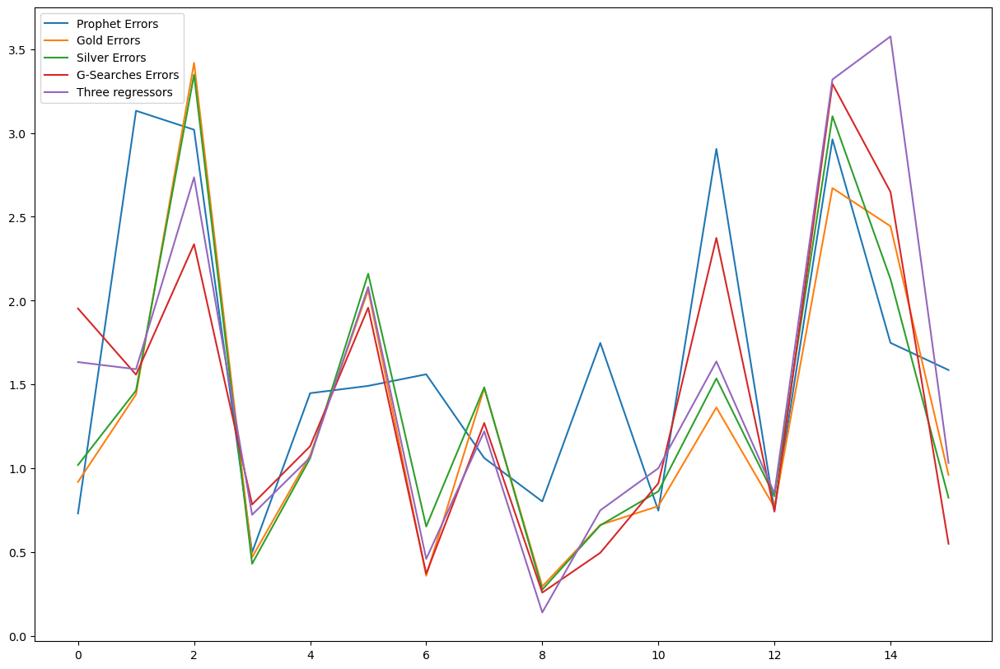

In [222]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))

# assuming df is your DataFrame
for column in df:
    plt.plot(df[column], label=column)

plt.legend()
plt.show()

In [243]:
mean_df=pd.DataFrame(index = ['Prophet No Reg','Reg-Gold','Reg-Silver',\
                                'Reg-G Searches','Reg-Three-Regressors'],columns = ['SMAPE (%)','MAE'])
mean_df['SMAPE (%)'] = [np.mean(prophet_errors),np.mean(gold_errors),\
                      np.mean(silver_errors),np.mean(gs_errors),np.mean(three_regressor_errors)]
mean_df['MAE'] = [np.mean(prophet_mae),np.mean(gold_mae)\
                  ,np.mean(silver_mae),np.mean(gs_mae),np.mean(three_regressor_mae)]
mean_df.index.name = 'Model'
mean_df

,SMAPE (%),MAE
Model,,
Prophet No Reg,1.613985,443.043147
Reg-Gold,1.322567,357.971608
Reg-Silver,1.364821,369.906042
Reg-G Searches,1.414698,381.341699
Reg-Three-Regressors,1.488335,402.236878


### Forecasting

In [230]:
merged_df.index.rename('ds', inplace=True)
merged_df1 = merged_df.copy()
merged_df1.rename(columns={'Date': 'ds'}, inplace=True)
merged_df1

,ds,y,gold_price,silver_price,btc_searches
ds,,,,,
0,2023-03-02 09:00:00,23449.933923,1836.68,20.8265,55
1,2023-03-02 10:00:00,23429.430046,1836.80,20.8629,55
2,2023-03-02 11:00:00,23412.569663,1836.15,20.8173,55
3,2023-03-02 12:00:00,23423.026553,1833.90,20.7980,55
4,2023-03-02 13:00:00,23349.073025,1836.07,20.8755,55
...,...,...,...,...,...
1069,2023-05-05 12:00:00,29126.246355,2017.23,25.6355,61
1070,2023-05-05 13:00:00,29061.097134,2015.57,25.6001,61
1071,2023-05-05 14:00:00,29113.834095,2016.68,25.6443,61


### Forecast using G Searches Prices

<Axes: title={'center': 'BTC (Prophet) Outlook 30d Out - Test size: 0.7'}>

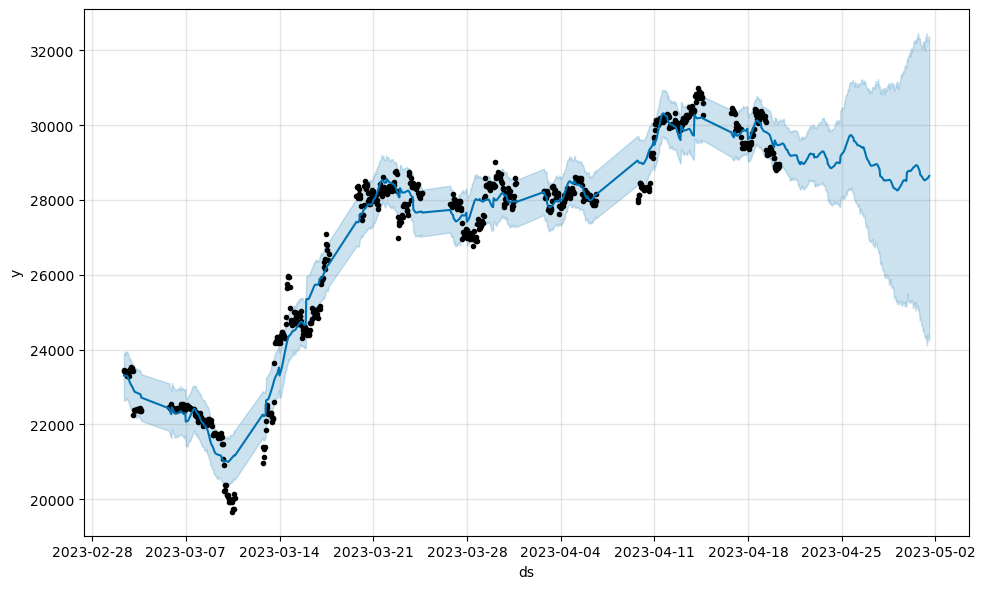

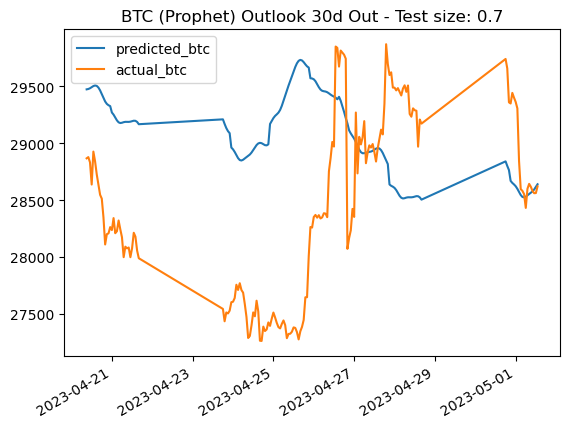

In [231]:
#merged_df = merged_df.reset_index()
y_train, y_test = temporal_train_test_split(merged_df1[['ds', 'y', 'btc_searches']].set_index('ds'))
y_train = y_train.reset_index()[['ds', 'y', 'btc_searches']]
y_test = y_test.reset_index()[['ds', 'y', 'btc_searches']]
m = Prophet()
m.add_regressor('btc_searches')
m.fit(y_train[['ds', 'y', 'btc_searches']])
future = m.make_future_dataframe(periods=len(y_test), freq='H')
future['btc_searches'] = merged_df1['btc_searches'].values[1:]
forecast_gs = m.predict(future)
m.plot(forecast_gs)
f = forecast_gs[forecast_gs.ds >= y_test.ds.min()][['ds', 'yhat']]
y_pred = f.set_index('ds').yhat
y_test = y_test.set_index('ds').y
filtered_s1 = y_pred.loc[y_pred.index.intersection(y_test.index)]
filtered_s2 = y_test.loc[y_test.index.intersection(y_pred.index)]
y_pred = filtered_s1
y_test = filtered_s2
perf = pd.merge(y_pred, y_test, how='inner', on='ds').\
                            rename(columns={'yhat':'predicted_btc', 'y':'actual_btc'}).reset_index()
perf.set_index('ds').plot(title=f'BTC (Prophet) Outlook 30d Out - Test size: {test_size}', xlabel="")

### Forecast using Silver Prices

<Axes: title={'center': 'BTC (Prophet) Outlook 30d Out - Test size: 0.7'}>

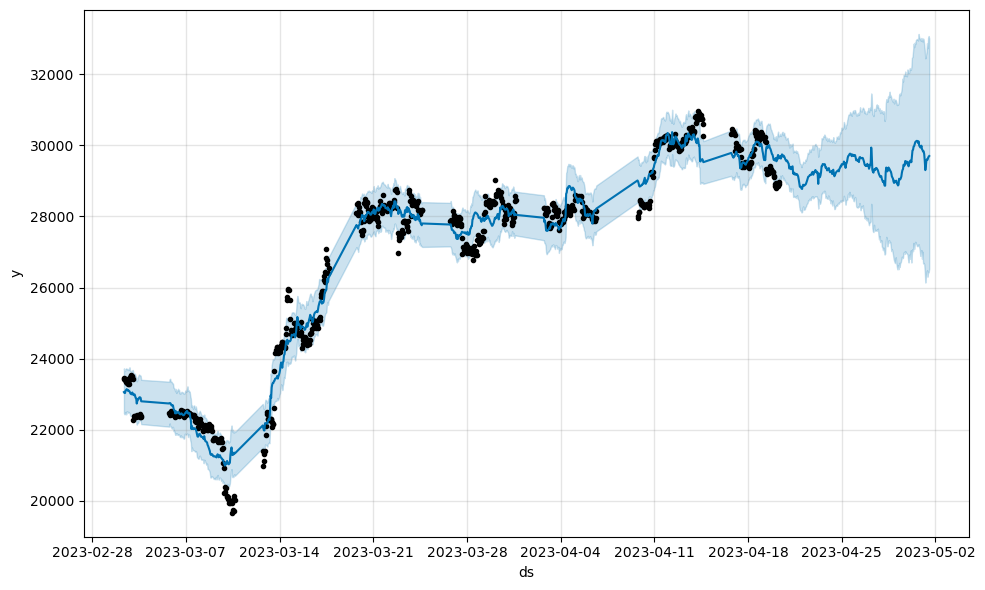

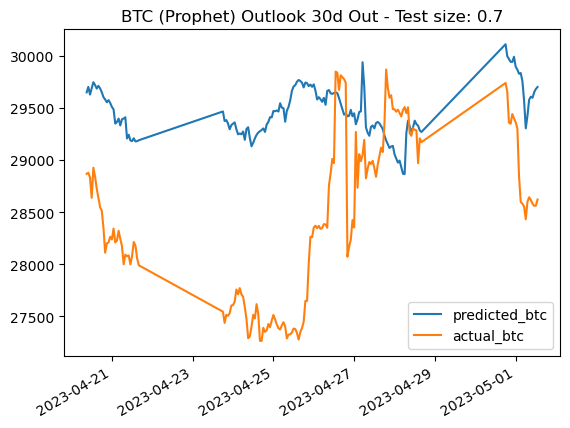

In [232]:
#merged_df = merged_df.reset_index()
y_train, y_test = temporal_train_test_split(merged_df1[['ds', 'y', 'silver_price']].set_index('ds'))
y_train = y_train.reset_index()[['ds', 'y', 'silver_price']]
y_test = y_test.reset_index()[['ds', 'y', 'silver_price']]
m = Prophet()
m.add_regressor('silver_price')
m.fit(y_train[['ds', 'y', 'silver_price']])
future_S = m.make_future_dataframe(periods=len(y_test), freq='H')
future['silver_price'] = merged_df1['silver_price'].values[1:]
forecast_sl = m.predict(future)
m.plot(forecast_sl)
f = forecast_sl[forecast_sl.ds >= y_test.ds.min()][['ds', 'yhat']]
y_pred = f.set_index('ds').yhat
y_test = y_test.set_index('ds').y
filtered_s1 = y_pred.loc[y_pred.index.intersection(y_test.index)]
filtered_s2 = y_test.loc[y_test.index.intersection(y_pred.index)]
y_pred = filtered_s1
y_test = filtered_s2
perf = pd.merge(y_pred, y_test, how='inner', on='ds').\
                            rename(columns={'yhat':'predicted_btc', 'y':'actual_btc'}).reset_index()
perf.set_index('ds').plot(title=f'BTC (Prophet) Outlook 30d Out - Test size: {test_size}', xlabel="")

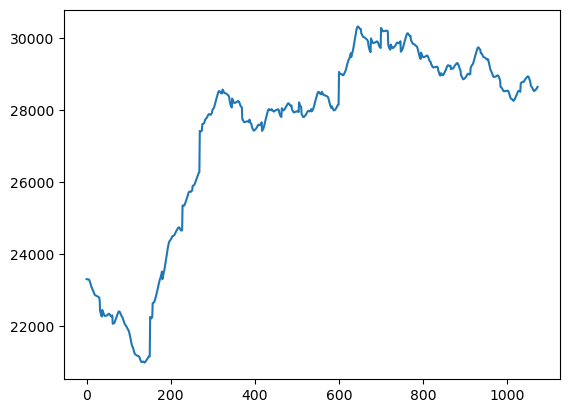

In [233]:
plt.plot(forecast_gs['yhat'])

### Iterating for optimal train-test split using Gold Data

/Users/venkat/opt/anaconda3/lib/python3.9/site-packages/prophet/plot.py:67: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



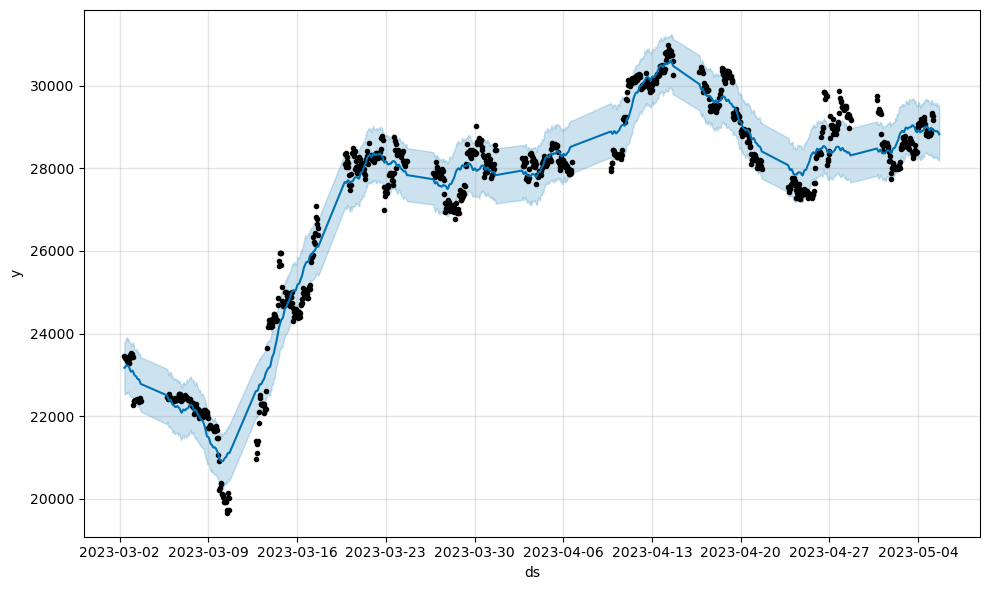

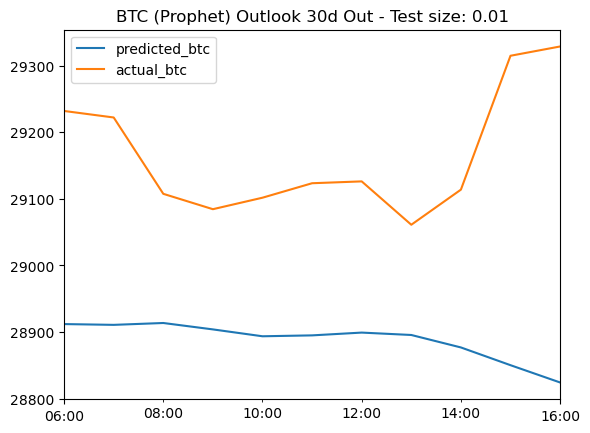

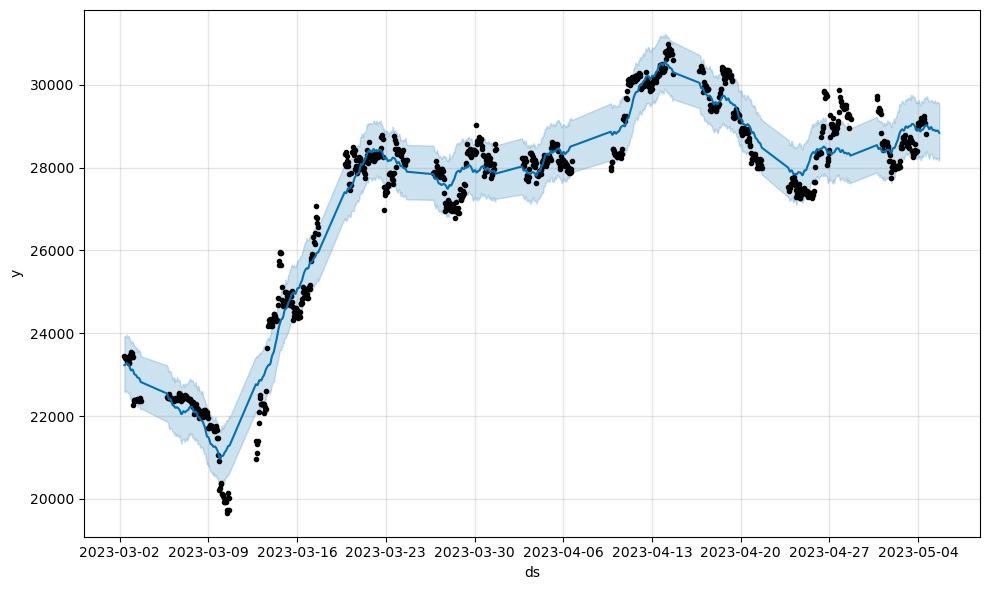

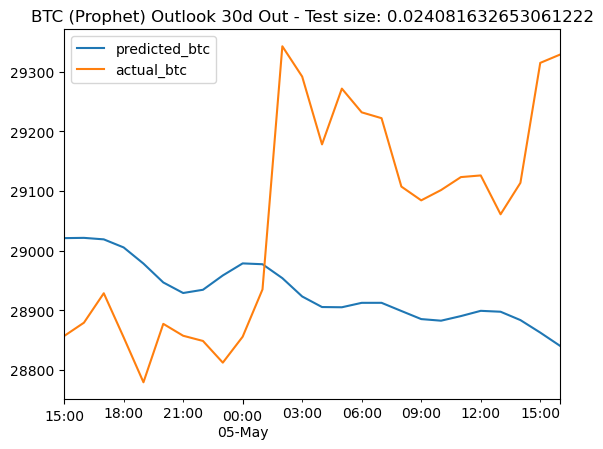

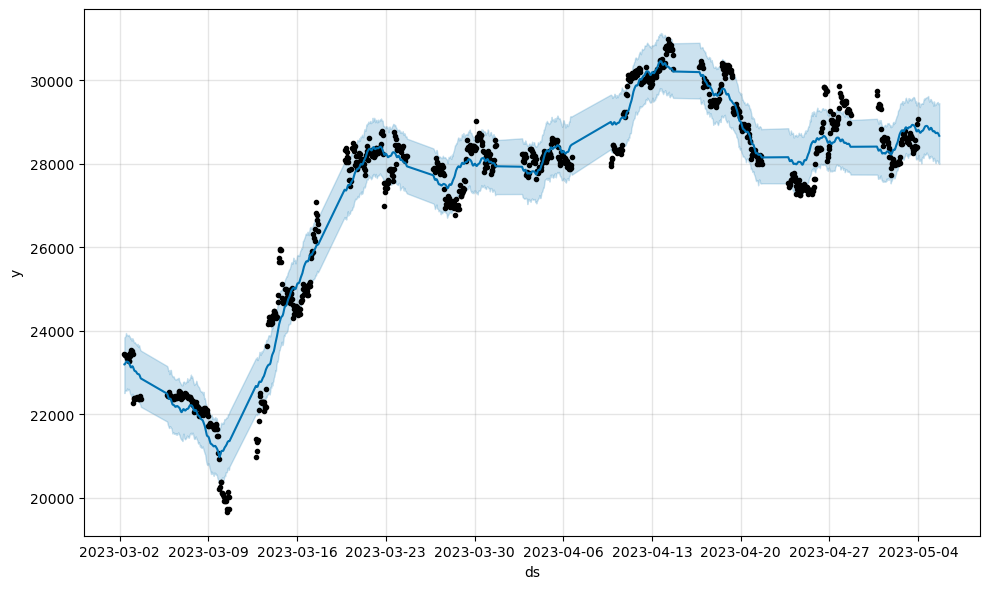

...

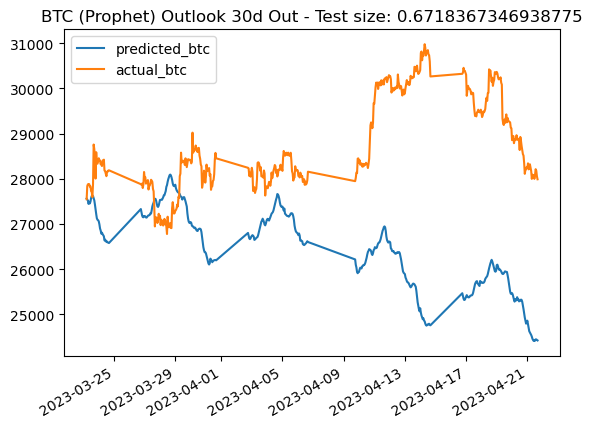

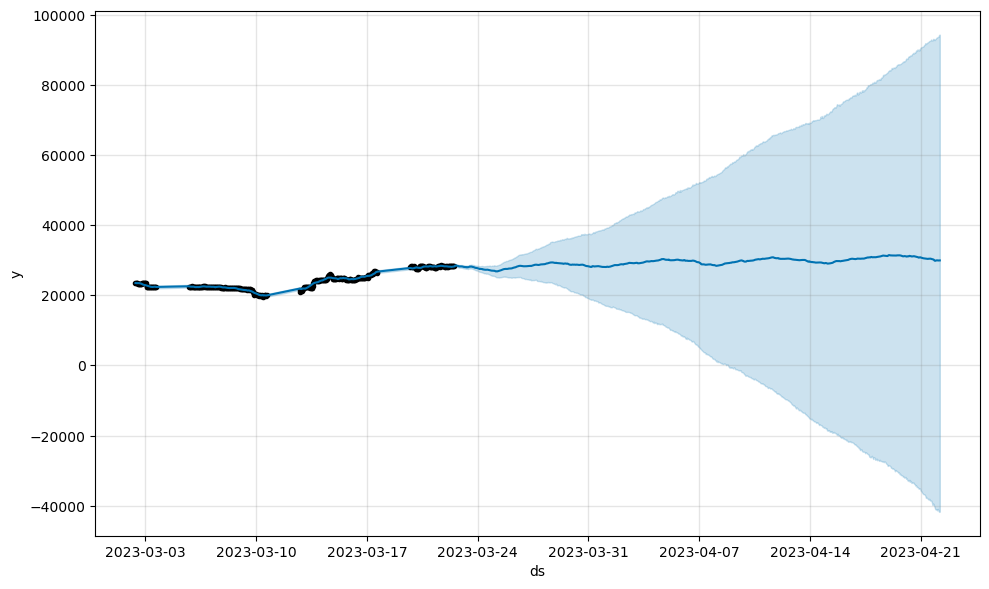

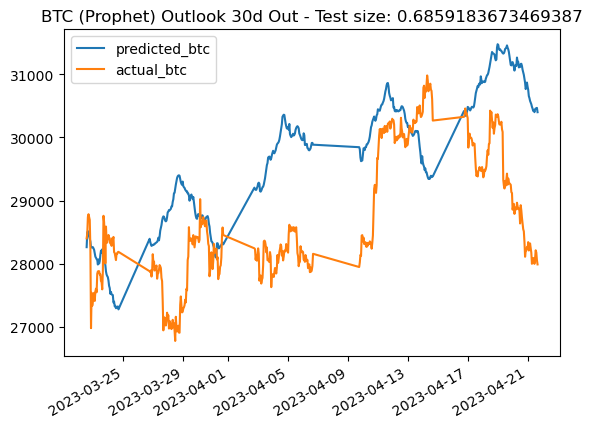

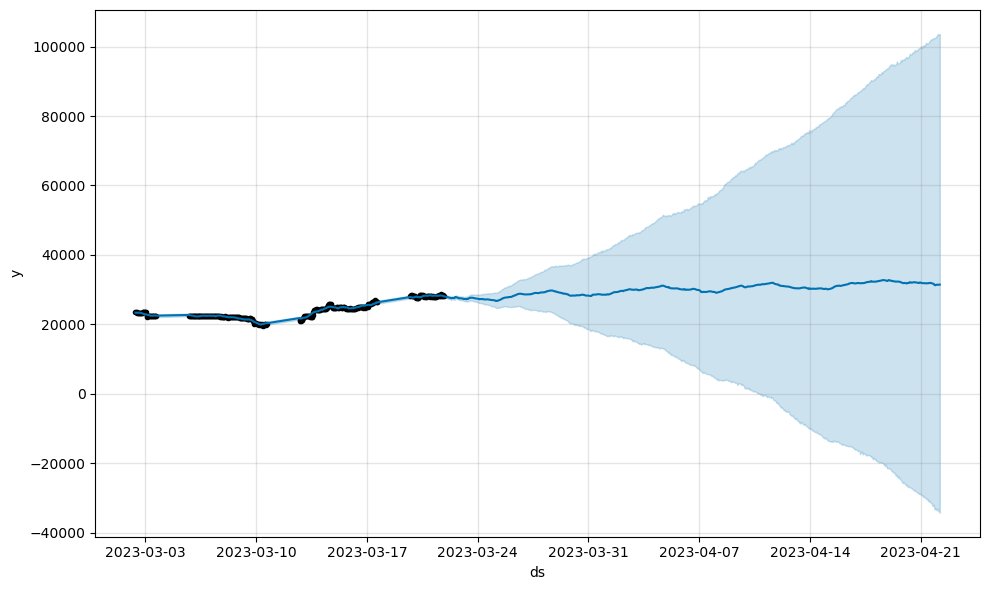

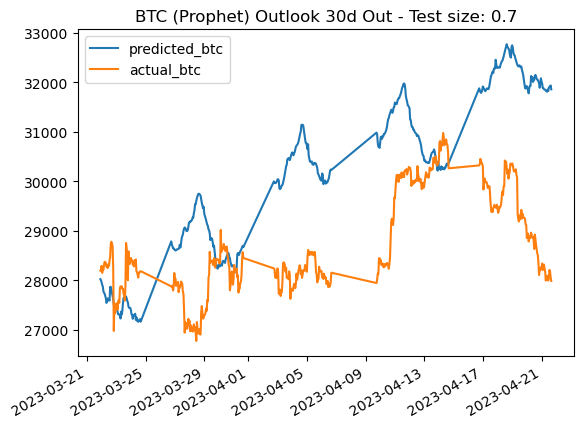

In [234]:
errors_gold = pd.DataFrame(columns=['Test Size', 'MAE', 'MSE'])

for i in np.linspace(0.01, 0.7, 50):
    test_size = i
    y_train, y_test = temporal_train_test_split(merged_df1[['ds', 'y', 'gold_price']].set_index('ds'), test_size=test_size)
    y_train = y_train.reset_index()[['ds', 'y', 'gold_price']]
    y_test = y_test.reset_index()[['ds', 'y', 'gold_price']]
    m = Prophet()
    m.add_regressor('gold_price')
    m.fit(y_train[['ds', 'y', 'gold_price']])
    future = m.make_future_dataframe(periods=len(y_test), freq='H')
    future['gold_price'] = merged_df1['gold_price'].values[1:]
    forecast = m.predict(future)
    m.plot(forecast)
    f = forecast[forecast.ds >= y_test.ds.min()][['ds', 'yhat']]
    y_pred = f.set_index('ds').yhat
    y_test = y_test.set_index('ds').y
    filtered_s1 = y_pred.loc[y_pred.index.intersection(y_test.index)]
    filtered_s2 = y_test.loc[y_test.index.intersection(y_pred.index)]
    y_pred = filtered_s1
    y_test = filtered_s2
    perf = pd.merge(y_pred, y_test, how='inner', on='ds').\
                            rename(columns={'yhat':'predicted_btc', 'y':'actual_btc'}).reset_index()
    perf.set_index('ds').plot(title=f'BTC (Prophet) Outlook 30d Out - Test size: {test_size}', xlabel="")
    
    # Compute error metrics
    MAE = mean_absolute_error(y_test, y_pred)
    SMAPE = smape(y_test, y_pred)
    
    error_data = pd.DataFrame({'Test Size': [test_size], 'MAE': [MAE], 'SMAPE': [SMAPE]})
    errors_gold = pd.concat([errors_gold, error_data], ignore_index=True)


In [235]:
errors_gold = errors_gold.set_index('Test Size')
errors_gold

,MAE,MSE,SMAPE
Test Size,,,
0.010000,276.586384,NaN,0.952436
0.024082,220.420337,NaN,0.759354
0.038163,279.100065,NaN,0.963500
0.052245,343.350019,NaN,1.189735
0.066327,352.869325,NaN,1.223819
0.080408,412.524623,NaN,1.434863
0.094490,400.295673,NaN,1.396958
0.108571,671.594827,NaN,2.362327
0.122653,1010.585213,NaN,3.579327


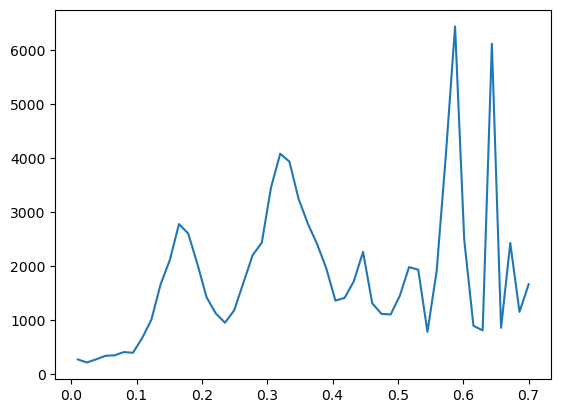

In [236]:
plt.plot(errors_gold['MAE'])

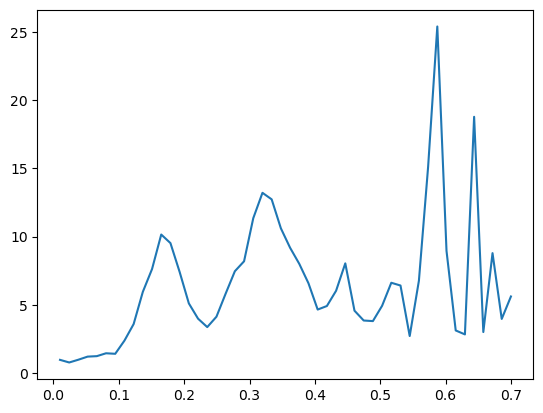

In [237]:
plt.plot(errors_gold['SMAPE'])

### Iterating for optimal split using Silver Data

/Users/venkat/opt/anaconda3/lib/python3.9/site-packages/prophet/plot.py:67: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



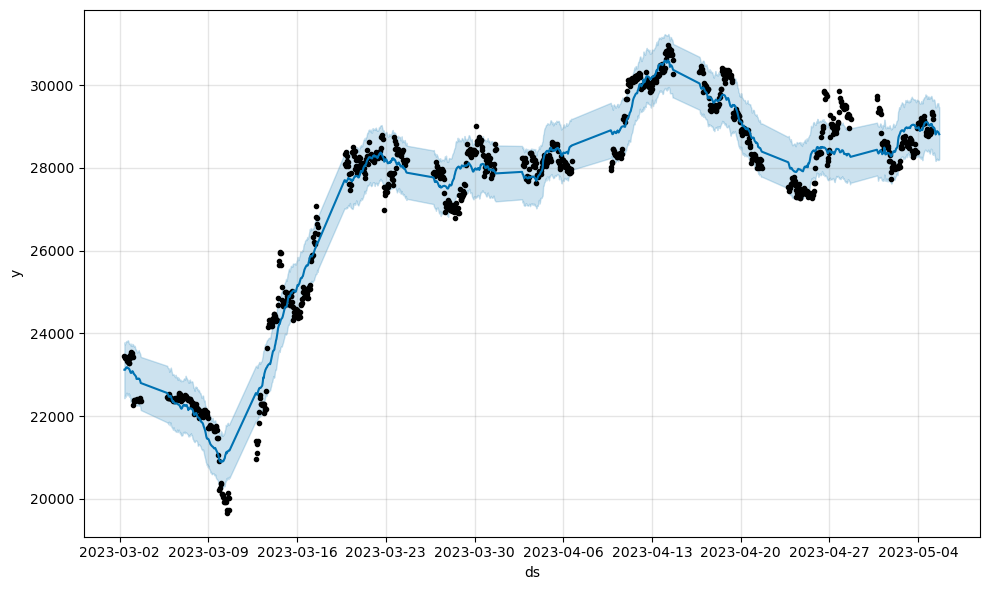

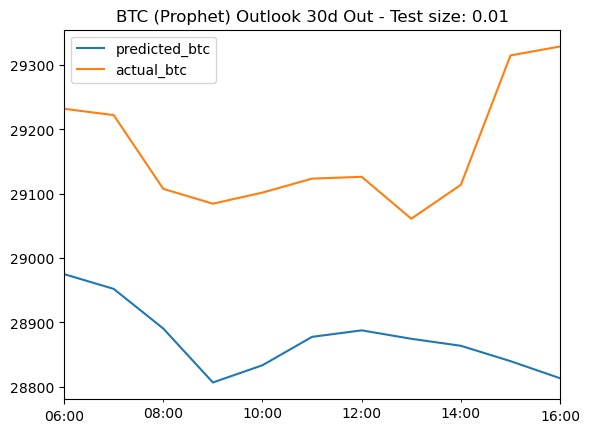

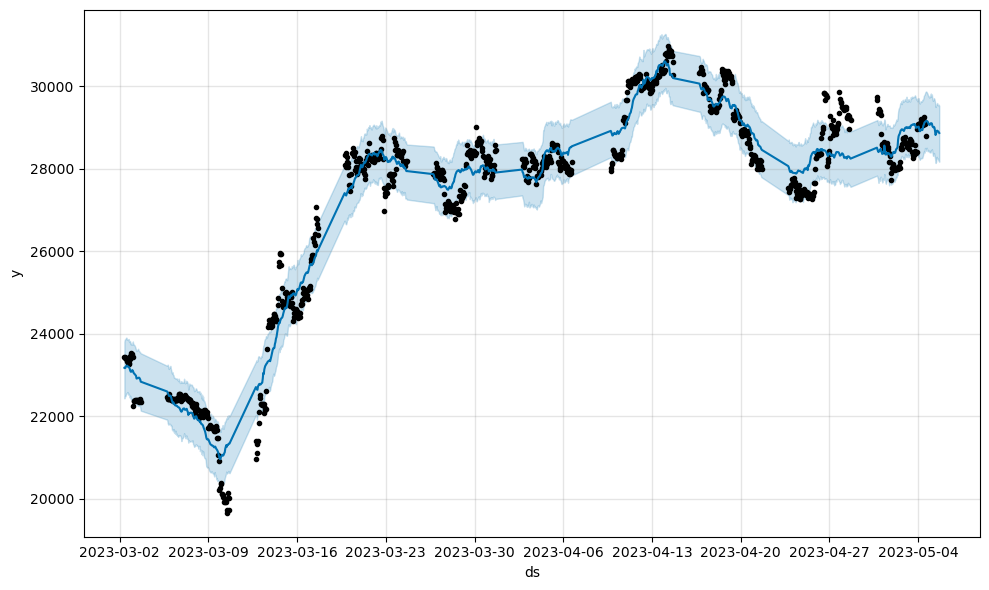

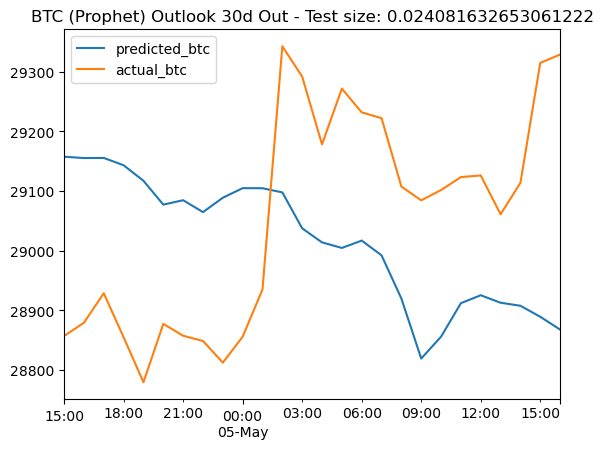

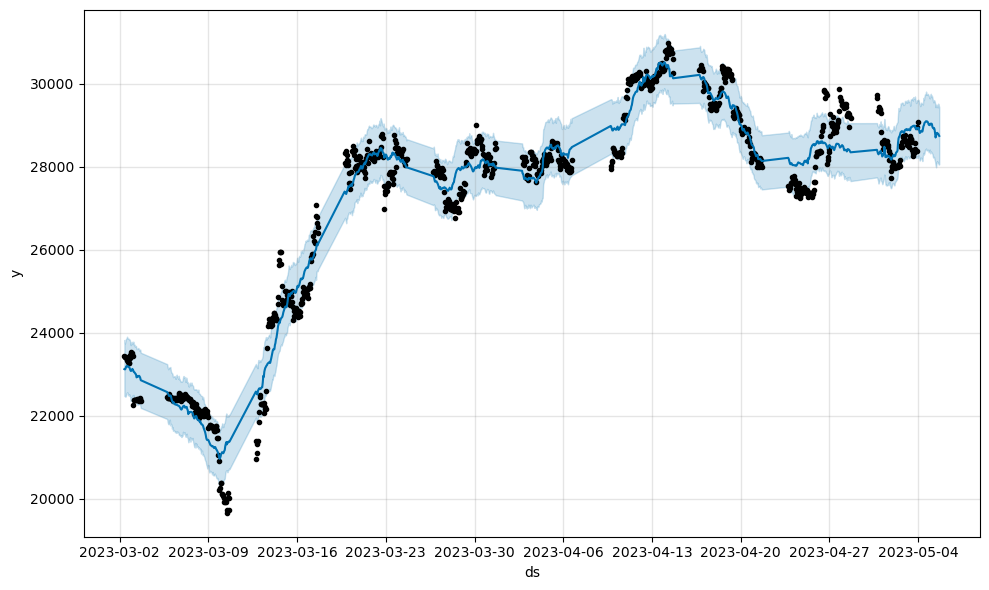

...

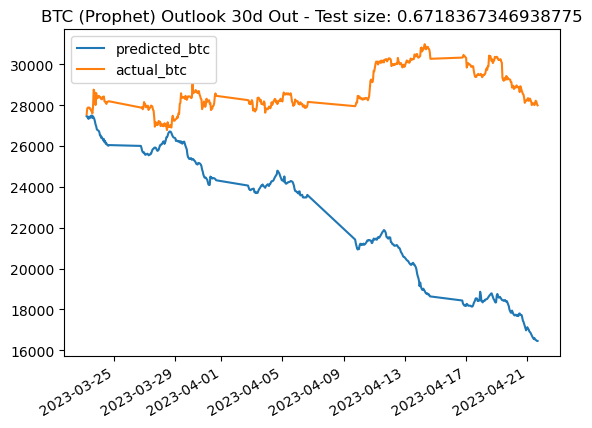

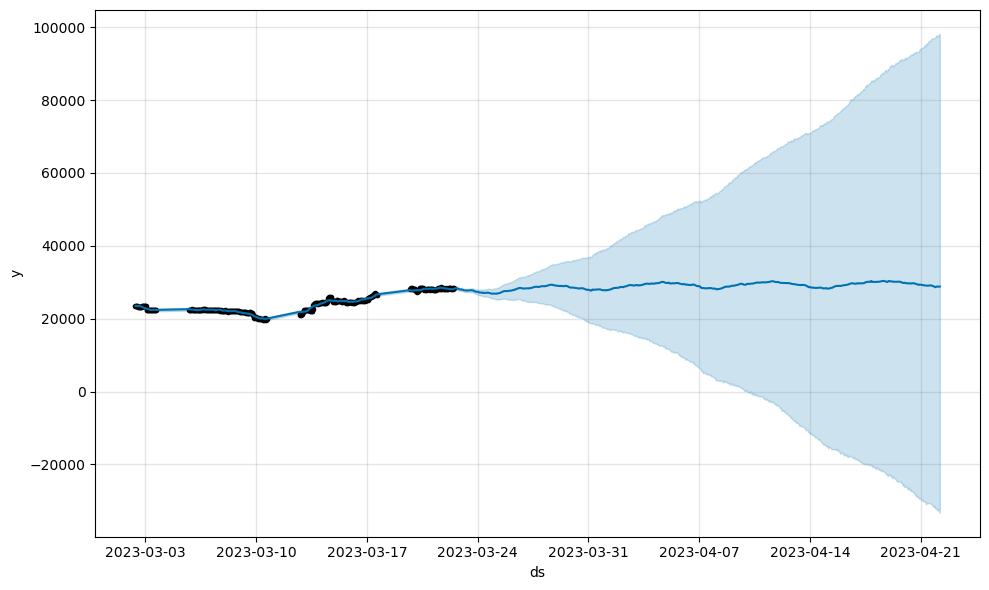

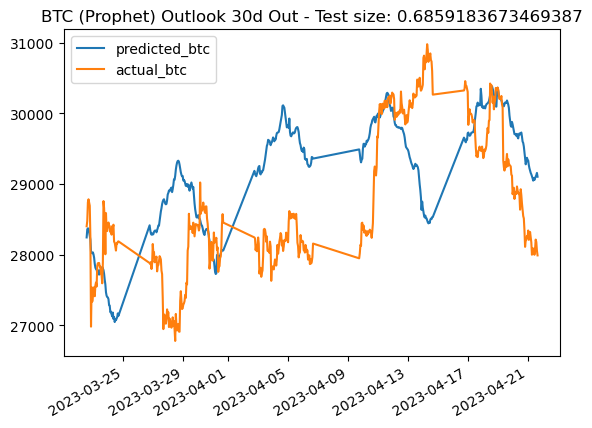

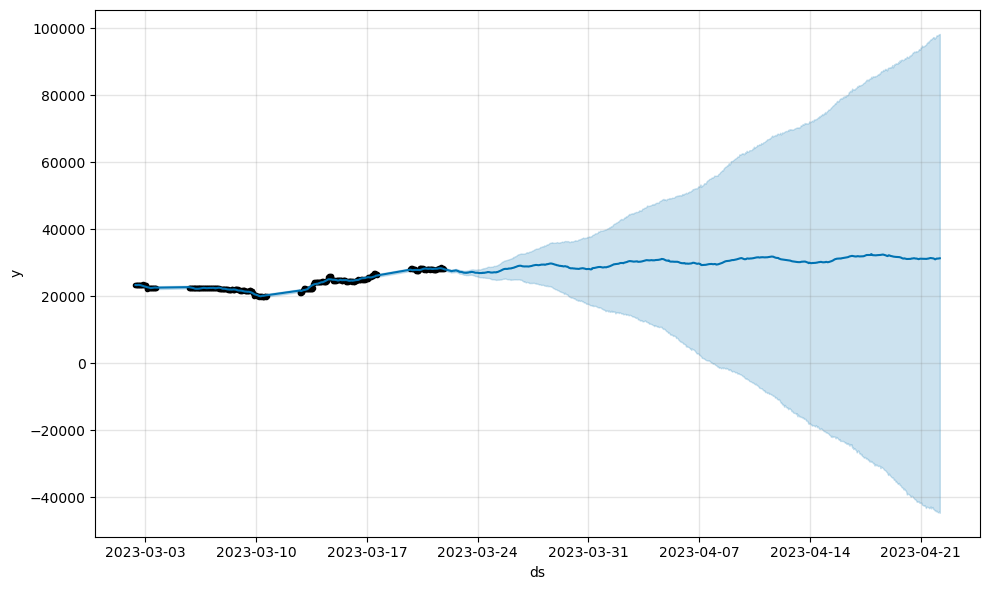

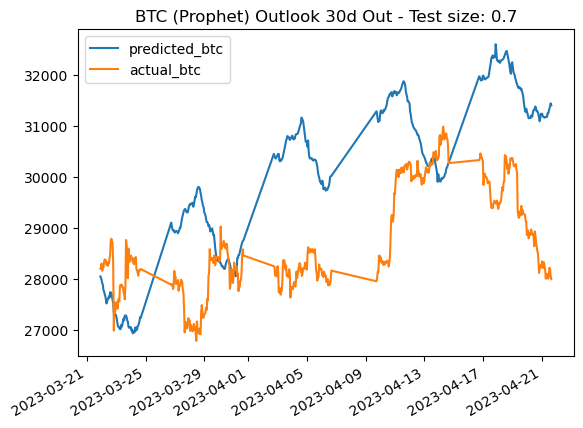

In [238]:
errors_silver = pd.DataFrame(columns=['Test Size', 'MAE', 'MSE'])

for i in np.linspace(0.01, 0.7, 50):
    test_size = i
    y_train, y_test = temporal_train_test_split(merged_df1[['ds', 'y', 'silver_price']].set_index('ds'), test_size=test_size)
    y_train = y_train.reset_index()[['ds', 'y', 'silver_price']]
    y_test = y_test.reset_index()[['ds', 'y', 'silver_price']]
    m = Prophet()
    m.add_regressor('silver_price')
    m.fit(y_train[['ds', 'y', 'silver_price']])
    future = m.make_future_dataframe(periods=len(y_test), freq='H')
    future['silver_price'] = merged_df1['silver_price'].values[1:]
    forecast = m.predict(future)
    m.plot(forecast)
    f = forecast[forecast.ds >= y_test.ds.min()][['ds', 'yhat']]
    y_pred = f.set_index('ds').yhat
    y_test = y_test.set_index('ds').y
    filtered_s1 = y_pred.loc[y_pred.index.intersection(y_test.index)]
    filtered_s2 = y_test.loc[y_test.index.intersection(y_pred.index)]
    y_pred = filtered_s1
    y_test = filtered_s2
    perf = pd.merge(y_pred, y_test, how='inner', on='ds').\
                            rename(columns={'yhat':'predicted_btc', 'y':'actual_btc'}).reset_index()
    perf.set_index('ds').plot(title=f'BTC (Prophet) Outlook 30d Out - Test size: {test_size}', xlabel="")
    
    # Compute error metrics
    MAE = mean_absolute_error(y_test, y_pred)
    SMAPE = smape(y_test, y_pred)
    
    error_data1 = pd.DataFrame({'Test Size': [test_size], 'MAE': [MAE], 'SMAPE': [SMAPE]})
    errors_silver = pd.concat([errors_silver, error_data1], ignore_index=True)


In [239]:
errors_silver = errors_silver.set_index('Test Size')
errors_silver

,MAE,MSE,SMAPE
Test Size,,,
0.010000,291.242929,NaN,1.003292
0.024082,249.846166,NaN,0.860420
0.038163,248.561917,NaN,0.857017
0.052245,329.344432,NaN,1.139563
0.066327,356.400120,NaN,1.234088
0.080408,410.548848,NaN,1.426147
0.094490,335.496038,NaN,1.169980
0.108571,547.326657,NaN,1.919263
0.122653,1007.650554,NaN,3.569583


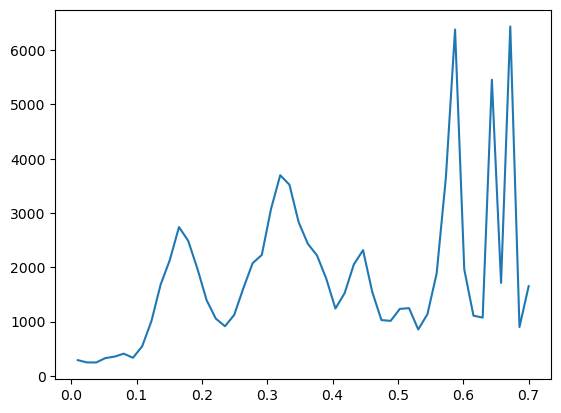

In [240]:
plt.plot(errors_silver['MAE'])

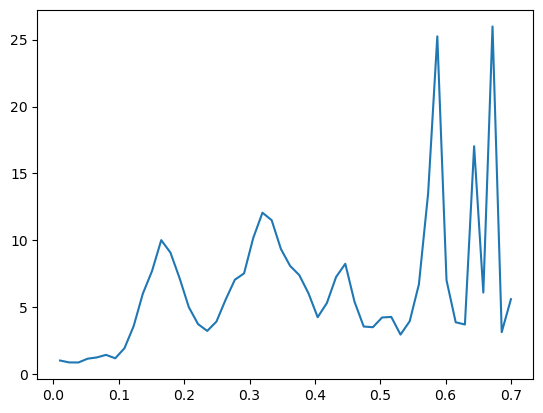

In [241]:
plt.plot(errors_silver['SMAPE'])

### Forecasting for optimal split using three regressors

<Axes: title={'center': 'BTC (Prophet) Outlook 30d Out - Test size: 0.7'}>

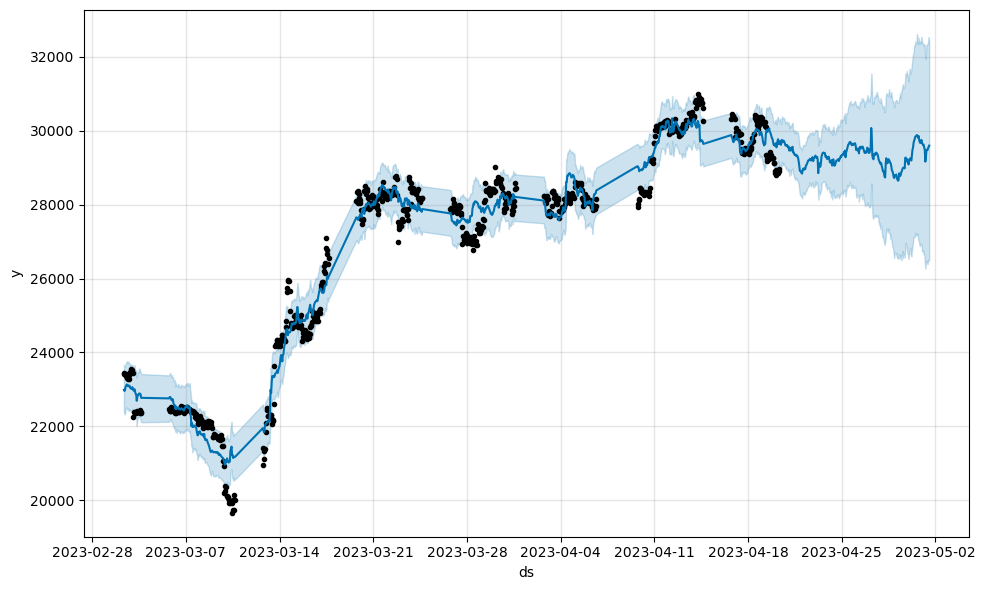

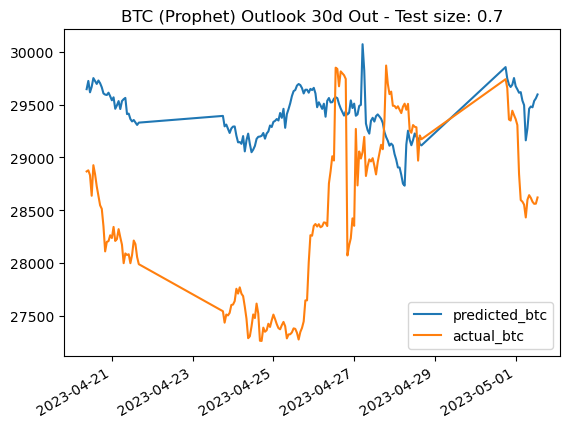

In [242]:
#merged_df = merged_df.reset_index()
y_train, y_test = temporal_train_test_split(merged_df1[['ds', 'y','gold_price','silver_price']].set_index('ds'))
y_train = y_train.reset_index()[['ds', 'y', 'gold_price','silver_price']]
y_test = y_test.reset_index()[['ds', 'y', 'gold_price','silver_price']]
m = Prophet()
m.add_regressor('silver_price')
m.add_regressor('gold_price')
m.fit(y_train[['ds', 'y','gold_price','silver_price']])
future = m.make_future_dataframe(periods=len(y_test), freq='H')
future[['gold_price','silver_price']] = merged_df1[['gold_price','silver_price']].values[1:]
forecast = m.predict(future)
m.plot(forecast)
f = forecast[forecast.ds >= y_test.ds.min()][['ds', 'yhat']]
y_pred = f.set_index('ds').yhat
y_test = y_test.set_index('ds').y
filtered_s1 = y_pred.loc[y_pred.index.intersection(y_test.index)]
filtered_s2 = y_test.loc[y_test.index.intersection(y_pred.index)]
y_pred = filtered_s1
y_test = filtered_s2
perf = pd.merge(y_pred, y_test, how='inner', on='ds').\
                            rename(columns={'yhat':'predicted_btc', 'y':'actual_btc'}).reset_index()
perf.set_index('ds').plot(title=f'BTC (Prophet) Outlook 30d Out - Test size: {test_size}', xlabel="")

### MAE plot b/w gold and silver